<a href="https://colab.research.google.com/github/andriyolo/Breadth-First-Search/blob/master/assignment1_PrimaProva.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [1]:
from google.colab import drive
drive.mount('/content/drive')
!ls -r '/content/drive/MyDrive/Colab Notebooks/IPCV'
!cp -r '/content/drive/MyDrive/Colab Notebooks/IPCV/dataset.zip' ./
!unzip dataset.zip

Mounted at /content/drive
dataset.zip
Archive:  dataset.zip
   creating: dataset/
  inflating: __MACOSX/._dataset      
   creating: dataset/scenes/
  inflating: __MACOSX/dataset/._scenes  
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: __MACOSX/dataset/._models  
  inflating: dataset/scenes/scene12.png  
  inflating: __MACOSX/dataset/scenes/._scene12.png  
  inflating: dataset/scenes/scene10.png  
  inflating: __MACOSX/dataset/scenes/._scene10.png  
  inflating: dataset/scenes/scene11.png  
  inflating: __MACOSX/dataset/scenes/._scene11.png  
  inflating: dataset/scenes/scene5.png  
  inflating: __MACOSX/dataset/scenes/._scene5.png  
  inflating: dataset/scenes/scene4.png  
  inflating: __MACOSX/dataset/scenes/._scene4.png  
  inflating: dataset/scenes/scene6.png  
  inflating: __MACOSX/dataset/scenes/._scene6.png  
  inflating: dataset/scenes/scene7.png  
  inflating: __MACOSX/dataset/scenes/._scene7.png  
 

In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

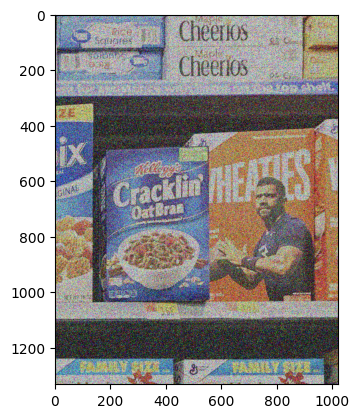

In [ ]:
image = cv2.imread('dataset/scenes/scene5.png')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()

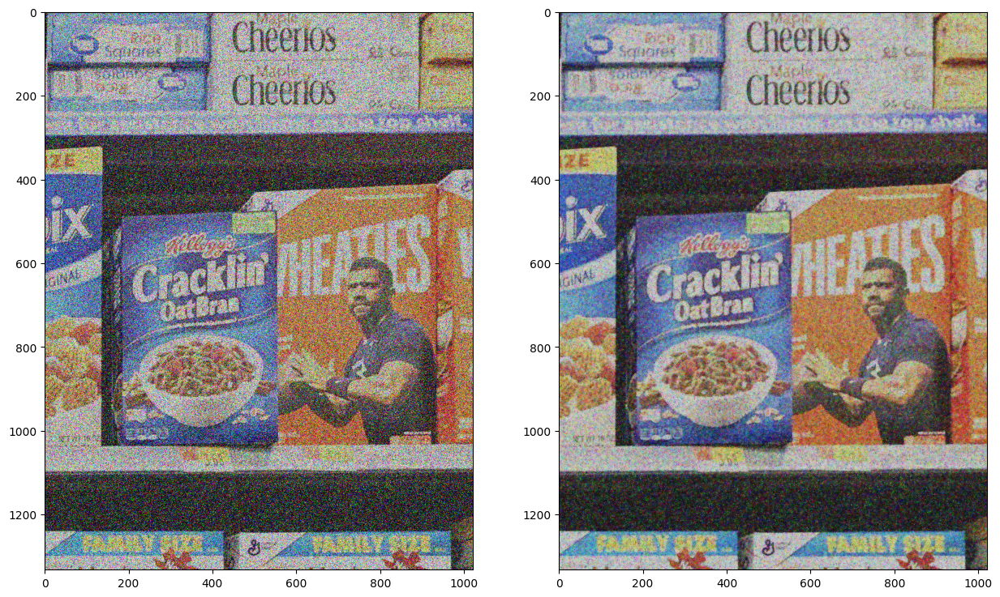

In [ ]:
denoised_rgb = cv2.bilateralFilter(image_rgb, 9, 150, 150)
#denoised_rgb2 = cv2.cvtColor(cv2.fastNlMeansDenoisingColored(image, None, 10, 30, 7, 28), cv2.COLOR_BGR2RGB)
#denoised_img = cv2.bilateralFilter(denoised_img, 9, 200, 75)
#denoised_image = cv2.cvtColor(denoised_rgb, cv2.COLOR_RGB2GRAY)

#plt.imshow(denoised_image, cmap = 'gray', vmin = 0, vmax = 255)
fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(image_rgb)
ax[1].imshow(denoised_rgb)
#ax[2].imshow(denoised_rgb2)
plt.show()

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

In [ ]:
def _object_detection(img_query, img_train, threshold=25, multiple_instances=False):
    '''
    img_query
    img_train
    threshold
    multiple_instances
    '''

    sol = []
    sift = cv2.SIFT_create()

    # compute keypoints and build descriptor for the query image
    kp_query = sift.detect(img_query)
    kp_query, des_query = sift.compute(img_query, kp_query)

    # train image to be masked at each step
    img_train_masked = np.copy(img_train)
    # train image marked with query images bounding boxes
    img_train_bb = np.copy(img_train)

    maybe_more_instances = True
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)

    while maybe_more_instances:
      #Search keypoints for target image and make descriptors
      kp_train = sift.detect(img_train_masked)
      kp_train, des_train = sift.compute(img_train_masked, kp_train)

      flann = cv2.FlannBasedMatcher(index_params, search_params)
      matches = flann.knnMatch(des_query,des_train,k=2)

      # store all the good matches as per Lowe's ratio test.
      good = []
      for m,n in matches:
          if m.distance < 0.7*n.distance:
              good.append(m)


In [49]:
def object_detection(img_query_list, img_train, threshold = 25, multiple_instances = False):
    '''
    img_query_list
    img_train
    threshold
    multiple_instances
    '''

    sol = [[] for i in range(len(img_query_list))]

    sift = cv2.SIFT_create()

    #Search keypoints for query images and make descriptors
    kp_query_list = []
    des_query_list = []
    for img_query in img_query_list:
        kp_query = sift.detect(img_query)
        kp_query, des_query = sift.compute(img_query, kp_query)
        kp_query_list.append(kp_query)
        des_query_list.append(des_query)

    img_train_masked = np.copy(img_train)
    img_train_bb = np.copy(img_train)

    no_more_instances = False
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    while not no_more_instances:
        #Search keypoints for target image and make descriptors
        kp_train = sift.detect(img_train_masked)
        kp_train, des_train = sift.compute(img_train_masked, kp_train)

        #For every query image find the matching descriptors
        good_list = []
        for kp_query, des_query in zip(kp_query_list, des_query_list):
            flann = cv2.FlannBasedMatcher(index_params, search_params)
            matches = flann.knnMatch(des_query,des_train,k=2)
            # store all the good matches as per Lowe's ratio test.
            good = []
            for m,n in matches:
                if m.distance < 0.7*n.distance:
                    good.append(m)
            good_list.append(good)

        # index of the object with the greatest number of matches
        best_match = np.argmax([len(g) for g in good_list])
        # list of all of matched points for the best matched object
        good = good_list[best_match]

        if multiple_instances:
            # saving the keypoints and the actual image for the best matched index
            kp_query = kp_query_list[best_match]
            img_query = img_query_list[best_match]
        else:
            kp_query = kp_query_list.pop(best_match)
            des_query_list.pop(best_match)
            # if only a single instance has to be found for each object,
            # only remove this image data from the image query images list
            # and from the list of remaining images to find
            img_query = img_query_list.pop(best_match)

        if len(good)>threshold:
            # building the corrspondences arrays of good matches
            src_pts = np.float32([ kp_query[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
            dst_pts = np.float32([ kp_train[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

            # Using RANSAC to estimate a robust homography.
            # It returns the homography M and a mask for the discarded points
            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            # Mask of discarded point used in visualization
            matchesMask = mask.ravel().tolist()

            # Corners of the query image
            h,w,_ = img_query.shape
            pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)

            try:
              # Projecting the corners into the train image
              dst = cv2.perspectiveTransform(pts,M)
              width = int(max(dst[2][0][0],dst[1][0][0])-min(dst[2][0][0],dst[1][0][0]))
              height = int(max(dst[1][0][1],dst[0][0][1]) - min(dst[1][0][1],dst[0][0][1]))
              x = int(dst[1][0][0] + (dst[2][0][0] - dst[1][0][0])/2)
              y = int(dst[0][0][1] + (dst[1][0][1] - dst[0][0][1])/2)

              img_train_bb = cv2.polylines(img_train_bb,[np.int32(dst)],True,[255, 255, 0],5, cv2.LINE_AA)

              sol[best_match].append(f"position: ({x}, {y}), width: {width}px, height: {height}px")

              #matching_img2 = cv2.cvtColor(img_train_masked, cv2.COLOR_RGB2GRAY)
              mask = np.ones_like(img_train_masked[:,:,0]) * 255
              cv2.fillPoly(mask, [np.int32(dst)], 0)
              mask = cv2.bitwise_not(mask)
              img_train_masked = cv2.inpaint(img_train_masked, mask, 3, cv2.INPAINT_TELEA)
            except:
                print('an error occured')
                pass
        else:
            no_more_instances = True
    return sol, img_train_bb

Scene  1
----------
Product 1 - 1 instance found:
  Instance 1 {position: (412, 539), width: 802px, height: 1048px}
Product 2 - 1 instance found:
  Instance 1 {position: (1247, 533), width: 802px, height: 1048px}

Scene  2
----------
Product 3 - 1 instance found:
  Instance 1 {position: (305, 493), width: 604px, height: 942px}
Product 4 - 1 instance found:
  Instance 1 {position: (926, 482), width: 631px, height: 950px}
Product 5 - 1 instance found:
  Instance 1 {position: (1527, 450), width: 560px, height: 844px}

Scene  3
----------
Product 6 - 1 instance found:
  Instance 1 {position: (298, 458), width: 600px, height: 672px}
Product 7 - 1 instance found:
  Instance 1 {position: (888, 460), width: 544px, height: 649px}
Product 8 - 1 instance found:
  Instance 1 {position: (1446, 397), width: 557px, height: 780px}

Scene  4
----------
Product 1 - 1 instance found:
  Instance 1 {position: (890, 917), width: 376px, height: 505px}
Product 8 - 1 instance found:
  Instance 1 {position: (34

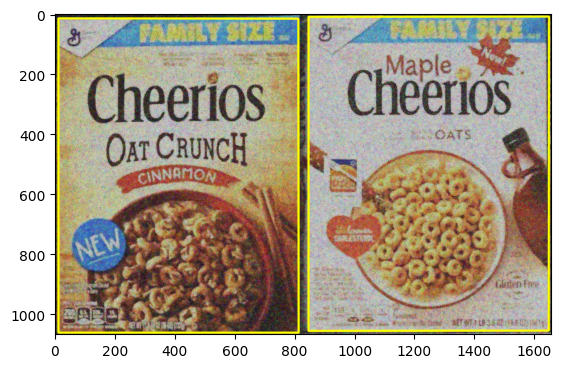

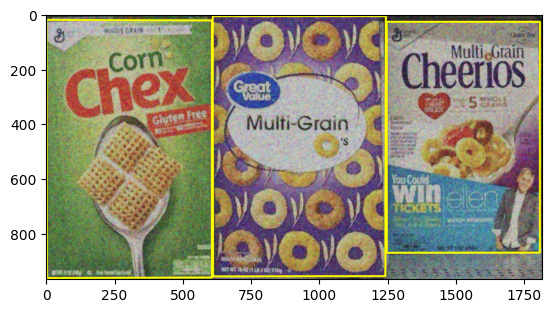

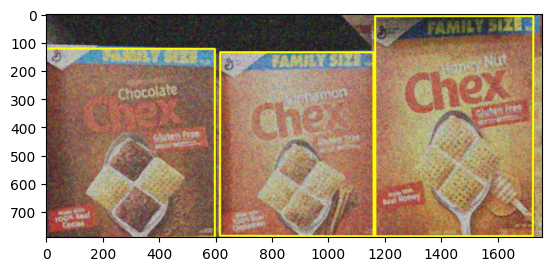

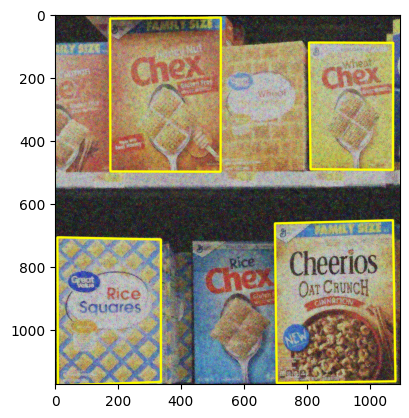

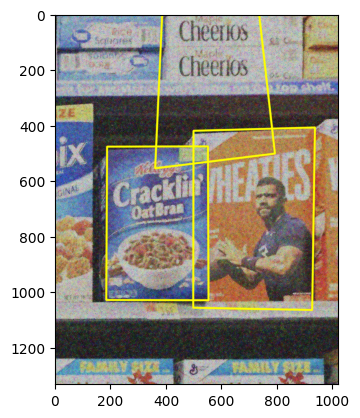

In [ ]:
img_query_list = []
for ref in range(1,15):
  img_query = cv2.imread(f'dataset/models/ref{ref}.png')
  img_query = cv2.cvtColor(img_query, cv2.COLOR_BGR2RGB)
  img_query_list.append( cv2.bilateralFilter(img_query, 13, 150, 75))

images_bb = []

for scene in range(1,6):
  img_train = cv2.imread(f'dataset/scenes/scene{scene}.png')
  img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
  denoised_train = cv2.bilateralFilter(img_train, 13, 150, 75)
  print('Scene ', scene)
  print('----------')
  sol, img_train_bb = object_detection(img_query_list=img_query_list.copy(), img_train=denoised_train)
  images_bb.append(img_train_bb)
  for prod in range(len(img_query_list)):
    if len(sol[prod])>0:
      print(f'Product {prod+1} - {len(sol[prod])} instance found:')
      for inst in range(len(sol[prod])):
        print(f'  Instance {inst+1}' + ' {' + sol[prod][inst] + '}')
  print()
for img in images_bb:
  plt.imshow(img)
  plt.show()

Scene  6
----------
Product 15 - 2 instance found:
  Instance 1 {position: (583, 619), width: 325px, height: 895px}
  Instance 2 {position: (177, 665), width: 348px, height: 1005px}

Scene  7
----------
Product 16 - 2 instance found:
  Instance 1 {position: (795, 461), width: 215px, height: 597px}
  Instance 2 {position: (1037, 464), width: 217px, height: 599px}

Scene  8
----------
Product 17 - 2 instance found:
  Instance 1 {position: (648, 568), width: 326px, height: 853px}
  Instance 2 {position: (990, 575), width: 327px, height: 854px}
Product 24 - 1 instance found:
  Instance 1 {position: (1337, 579), width: 326px, height: 852px}
Product 27 - 1 instance found:
  Instance 1 {position: (218, 547), width: 316px, height: 750px}

Scene  9
----------
Product 19 - 2 instance found:
  Instance 1 {position: (619, 374), width: 222px, height: 549px}
  Instance 2 {position: (853, 377), width: 222px, height: 564px}
Product 20 - 1 instance found:
  Instance 1 {position: (1363, 379), width: 231

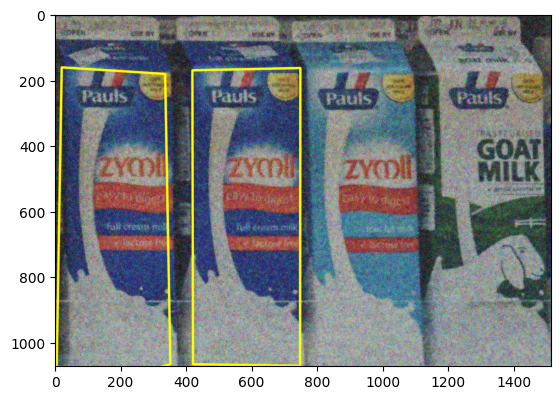

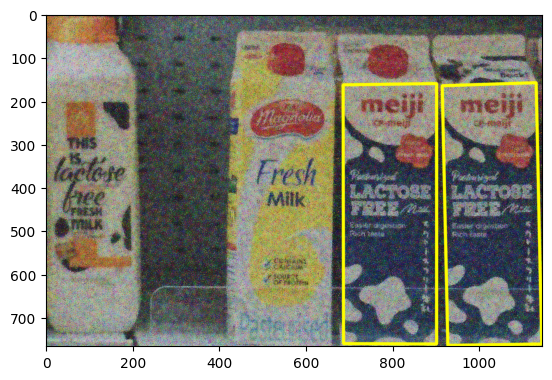

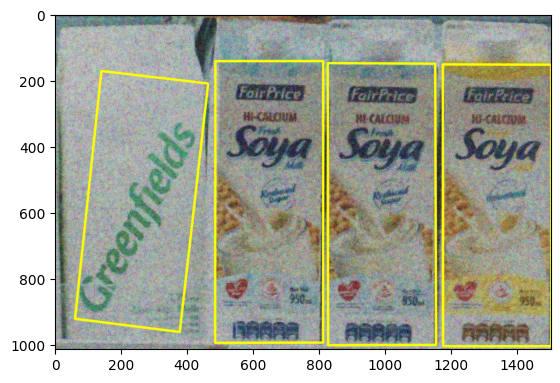

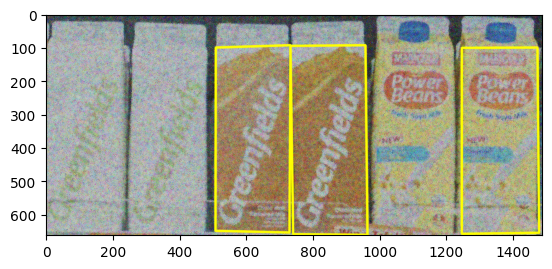

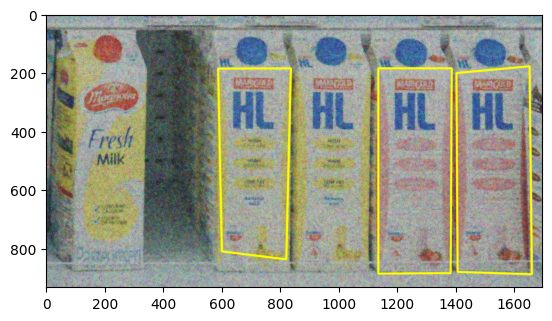

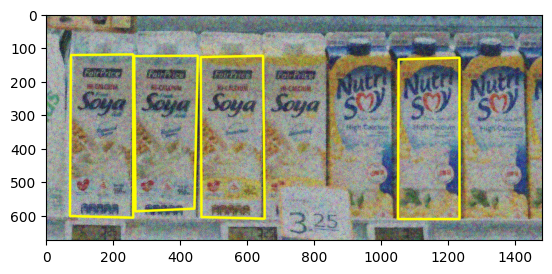

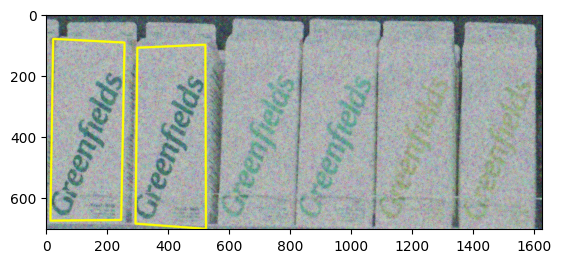

In [50]:
img_query_list = []
for ref in range(15,28):
  img_query = cv2.imread(f'dataset/models/ref{ref}.png')
  img_query = cv2.cvtColor(img_query, cv2.COLOR_BGR2RGB)
  img_query_list.append( cv2.bilateralFilter(img_query, 13, 150, 75))

images_bb = []

for scene in range(6,13):
  img_train = cv2.imread(f'dataset/scenes/scene{scene}.png')
  img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
  denoised_train = cv2.bilateralFilter(img_train, 13, 150, 75)
  print('Scene ', scene)
  print('----------')
  sol, img_train_bb = object_detection(img_query_list=img_query_list.copy(), img_train=denoised_train, multiple_instances=True)
  images_bb.append(img_train_bb)
  for prod in range(len(img_query_list)):
    if len(sol[prod])>0:
      print(f'Product {prod+15} - {len(sol[prod])} instance found:')
      for inst in range(len(sol[prod])):
        print(f'  Instance {inst+1}' + ' {' + sol[prod][inst] + '}')
  print()

for img in images_bb:
  plt.imshow(img)
  plt.show()

**Results overview:**

- scene 6: ✅
- scene 7: ✅
- scene 8: ✅
- scene 9:
  - ✅ 2x 19
  - ⚠️ 1x 20 - 1 missing
  - ❌ 2x 26/27
- scene 10:
  - ✅ 2x 22
  - ⚠️ 1x 21 - 1 missing
- scene 11:
  - ⚠️ 3x 17 - 1 missing (?)
  - ⚠️ 1x 25 - 2 missing
- scene 12:
  - ✅ 2x 26
  - ❌ 2x 27


In [ ]:
def single_object_detection(img_query, img_train, min_match_count=10):
    '''
    This function performs single object detection and returns
    all of the values needed to print the images along with the keypoints found
    '''

    sift = cv2.SIFT_create()
    kp_query = sift.detect(img_query)
    kp_train = sift.detect(img_train)
    kp_query, des_query = sift.compute(img_query, kp_query)
    kp_train, des_train = sift.compute(img_train, kp_train)

    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_query,des_train,k=2)
    # store all the good matches as per Lowe's ratio test.
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    if len(good)>min_match_count:
      # building the corrspondences arrays of good matches
      src_pts = np.float32([ kp_query[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
      dst_pts = np.float32([ kp_train[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

      # Using RANSAC to estimate a robust homography.
      # It returns the homography M and a mask for the discarded points
      M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

      # Mask of discarded point used in visualization
      matchesMask = mask.ravel().tolist()

      # Corners of the query image
      h,w, _ = img_query.shape
      pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)

      # Projecting the corners into the train image
      dst = cv2.perspectiveTransform(pts,M)

      width = int(max(dst[2][0][0],dst[1][0][0])-min(dst[2][0][0],dst[1][0][0]))
      height = int(max(dst[1][0][1],dst[0][0][1]) - min(dst[1][0][1],dst[0][0][1]))
      x = int(dst[1][0][0] + (dst[2][0][0] - dst[1][0][0])/2)
      y = int(dst[0][0][1] + (dst[1][0][1] - dst[0][0][1])/2)

      # cv2.circle(
      #   img_train_p, # Image on which to draw the circle.
      #   (x,y), # Position of the center of the circle (pixel position).
      #   30, # Radius of the circle.
      #   [255, 255, 255], # Colour of the circle (white).
      #   5 # Thickness.
      # )
      # plt.imshow(img_train_p)
      # plt.show()

      return True, (src_pts, dst_pts), len(good), dst, x, y, width, height

    return False,


In [ ]:
def parse_single_detection_result(img, good, corners, x, y, width, height):
  print('keypoints found: ', good)
  print(f"position: ({x}, {y}), width: {width}px, height: {height}px")
  out_img = cv2.polylines(img,[np.int32(corners)],True,[255, 255, 0],5, cv2.LINE_AA)
  plt.imshow(out_img)
  plt.show()

In [ ]:
def plot_matching_points(img, pts):
  i = np.copy(img)
  for pixel in pts:
    cv2.circle(
      i, # Image on which to draw the circle.
      (int(pixel[0][0]), int(pixel[0][1])), # Position of the center of the circle (pixel position).
      30, # Radius of the circle.
      [255, 50, 255], # Colour of the circle (white).
      5 # Thickness.
    )

  plt.imshow(i)
  plt.show()

In [ ]:
MODEL_START = 1
MODEL_END = 14
SCENE_START = 1
SCENE_END = 5

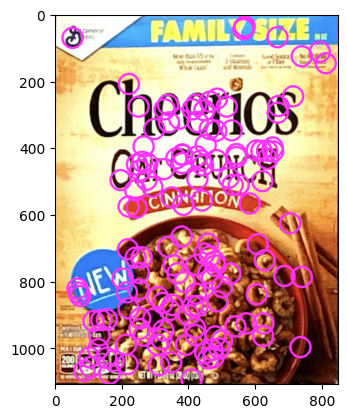

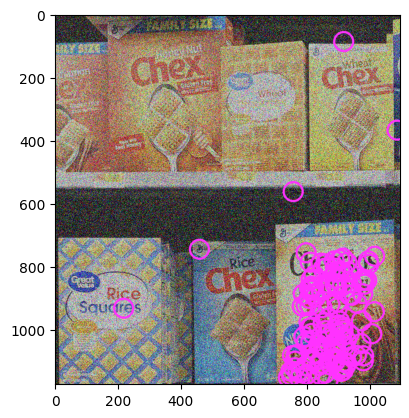

keypoints found:  160
position: (889, 917), width: 375px, height: 506px


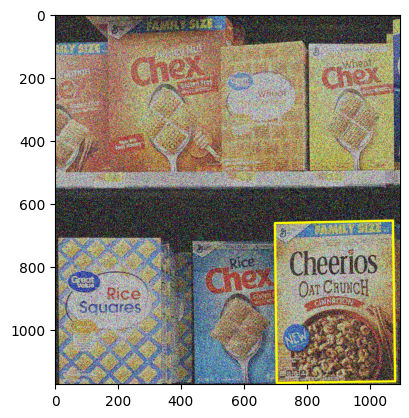

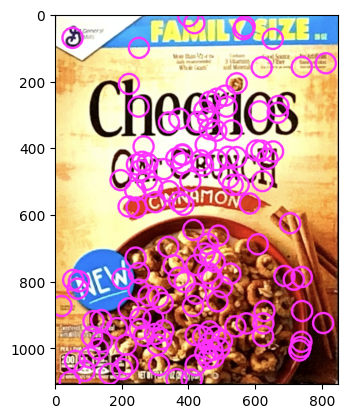

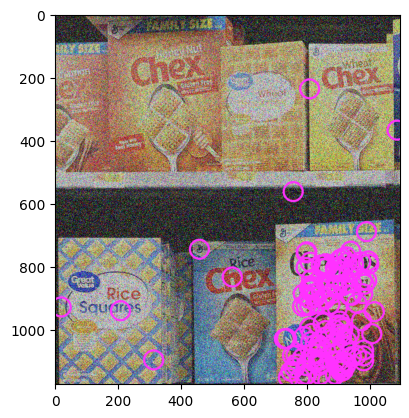

keypoints found:  161
position: (890, 917), width: 375px, height: 505px


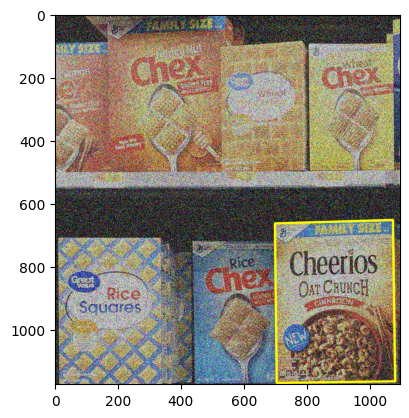

In [ ]:
def run_detector(img_query, img_train):
  success, *rest = object_detection(img_query, img_train)
  if success:
    (src_pts, dst_pts), *rest = rest
    plot_matching_points(img_query, src_pts)
    plot_matching_points(img_train, dst_pts)
    parse_single_detection_result(img_train, *rest)

  return success, rest

res_array = []

for i_scene in range(SCENE_START, SCENE_END+1):
  for i_model in range(MODEL_START, MODEL_END+1):
    img_train = cv2.imread(f'dataset/scenes/scene{i_scene}.png')
    img_query = cv2.imread(f'dataset/models/ref{i_model}.png')
    img_query = cv2.cvtColor(img_query, cv2.COLOR_BGR2RGB)
    img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
    denoised_train = cv2.bilateralFilter(img_train, 9, 50, 50)

    res_train = run_detector(img_query, img_train)
    res_denoised = run_detector(img_query, denoised_train)

    res_array.append((res_train, res_denoised))